# This project is based on this video, where a data analyst goes through a real-life problem and solves it using software like Python and SQL, using Deepnote.
# Given that Deepnote is a platform with payment plans, I had issues finishing the tasks shown in the video and so I decided to complete the quest entirely in VS Code using Python. 

# https://www.youtube.com/watch?v=4VkAwPYgSgk&list=PLEiJy4bNlqNGgGGnZDSZBDnBrB_tUrfFY&index=10

# Real life Problem  

We are asked to find the best reviewers on our platform since we want to create an incentive program where we give our best reviewers early access to games and certain perks for giving great reviews.


Problem - How are we defining “Best reviewers” ? 
We were informed that we should use the data in the votes_helpful column. Issues that can come about are if the reviewer only made one review and luckily gained a huge amount of votes (one-hit wonders). The threshold will be around 1000 people. 


We will find the best method to define a top reviewer and create an interactive dashboard to obtain a better idea of the population of “top reviewers”. 


In [1]:
import plotly
import pandas as pd
import numpy as np 
import plotly.express as px
import os

In [2]:
pwd = os.getcwd()
pwd

'/Users/jovanii/Desktop/top_reviewers_project'

# Obtain the data from the Excel csv files into Python. 

In [3]:
author_dataset = pd.read_csv(pwd + '/author_info.csv')
game_dataset = pd.read_csv( pwd + '/game_info.csv'   )
purchase_dataset = pd.read_csv( pwd + '/purchase_info.csv'  )
review_dataset = pd.read_csv( pwd + '/review_info.csv')

/var/folders/yk/bd143n2d1233yn6yphs1_q1c0000gn/T/ipykernel_1949/2940341571.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  author_dataset = pd.read_csv(pwd + '/author_info.csv')


In [4]:
# See the top 10 values in the data frames we constructed.

author_dataset.head(10)
# game_dataset.head(10)
# purchase_dataset.head(10)
# review_dataset.head(10)

,review_id,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
0,68675252,76561198199699706,56,3,5552,0,5517.0,1588774891
1,68675154,76561198320854803,112,8,33707,0,27915.0,1593309535
2,68674806,76561198282201987,17,9,3166,0,2633.0,1603555062
3,68673945,76561199016358734,3,2,6579,0,3569.0,1608999345
4,68673504,76561198125284145,1001,46,199,0,65.0,1590811471
5,68673403,76561198270161210,35,4,401,0,401.0,1586808634
6,68672722,76561198058209736,67,8,7098,0,4287.0,1598825543
7,68672192,76561198137909668,25,3,3949,0,2358.0,1596880740
8,68670882,76561198236134140,39,5,10588,0,10441.0,1593179923
9,68669904,76561198008177082,55,11,2057,0,1671.0,1588877358


In [5]:

# list(author_dataset.columns)
# list(game_dataset.columns)
# list(purchase_dataset.columns)
list(review_dataset.columns)

['review_id',
 'language',
 'review',
 'timestamp_created',
 'timestamp_updated',
 'recommended',
 'votes_helpful',
 'votes_funny',
 'weighted_vote_score',
 'comment_count']

In [6]:
merged_dataset = pd.merge( author_dataset , game_dataset , how = 'left' , on = 'review_id')
merged_dataset

,review_id,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played,app_id,app_name
0,68675252,76561198199699706,56,3,5552,0,5517.0,1588774891,489830,The Elder Scrolls V: Skyrim Special Edition
1,68675154,76561198320854803,112,8,33707,0,27915.0,1593309535,489830,The Elder Scrolls V: Skyrim Special Edition
2,68674806,76561198282201987,17,9,3166,0,2633.0,1603555062,489830,The Elder Scrolls V: Skyrim Special Edition
3,68673945,76561199016358734,3,2,6579,0,3569.0,1608999345,489830,The Elder Scrolls V: Skyrim Special Edition
4,68673504,76561198125284145,1001,46,199,0,65.0,1590811471,489830,The Elder Scrolls V: Skyrim Special Edition
...,...,...,...,...,...,...,...,...,...,...
999995,47310228,76561198102901681,434,11,1173,0,748.0,1544726959,517630,Just Cause 4
999996,47310217,76561198062222284,408,13,13,0,13.0,1543945455,517630,Just Cause 4
999997,47310195,76561198053327292,258,30,755,0,298.0,1593884179,517630,Just Cause 4
999998,47310155,76561198049307281,20,8,3412,0,1463.0,1601999866,517630,Just Cause 4


In [7]:
merged_dataset_two = pd.merge( merged_dataset , purchase_dataset , how = 'left' , on = 'review_id')
merged_dataset_two

,review_id,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played,app_id,app_name,steam_purchase,received_for_free,written_during_early_access
0,68675252,76561198199699706,56,3,5552,0,5517.0,1588774891,489830,The Elder Scrolls V: Skyrim Special Edition,False,False,False
1,68675154,76561198320854803,112,8,33707,0,27915.0,1593309535,489830,The Elder Scrolls V: Skyrim Special Edition,True,False,False
2,68674806,76561198282201987,17,9,3166,0,2633.0,1603555062,489830,The Elder Scrolls V: Skyrim Special Edition,True,False,False
3,68673945,76561199016358734,3,2,6579,0,3569.0,1608999345,489830,The Elder Scrolls V: Skyrim Special Edition,False,False,False
4,68673504,76561198125284145,1001,46,199,0,65.0,1590811471,489830,The Elder Scrolls V: Skyrim Special Edition,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,47310228,76561198102901681,434,11,1173,0,748.0,1544726959,517630,Just Cause 4,False,False,False
999996,47310217,76561198062222284,408,13,13,0,13.0,1543945455,517630,Just Cause 4,False,False,False
999997,47310195,76561198053327292,258,30,755,0,298.0,1593884179,517630,Just Cause 4,True,False,False
999998,47310155,76561198049307281,20,8,3412,0,1463.0,1601999866,517630,Just Cause 4,True,False,False


In [8]:
merged_dataset_three = pd.merge(merged_dataset_two , review_dataset , how = 'left' , on = 'review_id')
merged_dataset_three

,review_id,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played,app_id,app_name,...,written_during_early_access,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,weighted_vote_score,comment_count
0,68675252,76561198199699706,56,3,5552,0,5517.0,1588774891,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,russian,"Божечки, это же 10/10",1588772815,1588772815,True,0,0,0.000000,0
1,68675154,76561198320854803,112,8,33707,0,27915.0,1593309535,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,"What can I say, the best game ever?\nThe BEST ...",1588772690,1588772690,True,0,0,0.000000,0
2,68674806,76561198282201987,17,9,3166,0,2633.0,1603555062,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,good,1588772228,1591709306,True,1,0,0.523810,0
3,68673945,76561199016358734,3,2,6579,0,3569.0,1608999345,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,russian,WDPSLDFLZLD\n,1588771138,1588771138,True,0,0,0.000000,0
4,68673504,76561198125284145,1001,46,199,0,65.0,1590811471,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,schinese,Pretty cool game;haven't played it much though.,1588770601,1588770601,True,0,0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,47310228,76561198102901681,434,11,1173,0,748.0,1544726959,517630,Just Cause 4,...,False,english,Its rly not that bad.,1544024434,1544024434,True,0,1,0.478261,0
999996,47310217,76561198062222284,408,13,13,0,13.0,1543945455,517630,Just Cause 4,...,False,french,Aucune option pour changer le FOV (qui doit êt...,1544024395,1544024395,False,20,4,0.521904,0
999997,47310195,76561198053327292,258,30,755,0,298.0,1593884179,517630,Just Cause 4,...,False,russian,В игре многое поправили. Исправили кучу всего ...,1544024314,1552200696,True,0,0,0.514576,0
999998,47310155,76561198049307281,20,8,3412,0,1463.0,1601999866,517630,Just Cause 4,...,False,english,i love it ahhhhhhhhhhhhhhhhhh,1544024176,1544024176,True,0,1,0.478723,0


In [9]:
# Make of a copy of the final merge dataset. 
dataset = merged_dataset_three.copy()


In [10]:
list(dataset.columns)

['review_id',
 'author_steamid',
 'author_num_games_owned',
 'author_num_reviews',
 'author_playtime_forever',
 'author_playtime_last_two_weeks',
 'author_playtime_at_review',
 'author_last_played',
 'app_id',
 'app_name',
 'steam_purchase',
 'received_for_free',
 'written_during_early_access',
 'language',
 'review',
 'timestamp_created',
 'timestamp_updated',
 'recommended',
 'votes_helpful',
 'votes_funny',
 'weighted_vote_score',
 'comment_count']

  # Find the total upvotes a user/reviewer obtained.


In [11]:
total_helpful_votes = dataset.groupby('author_steamid')['votes_helpful'].sum().to_frame('total_upvotes').reset_index().sort_values(by = 'total_upvotes' , ascending = False)
total_helpful_votes

,author_steamid,total_upvotes
634462,76561198301678331,26149
265871,76561198068792591,15526
374777,76561198107977827,14349
239990,76561198060932732,10610
530595,76561198193312194,10495
...,...,...
26,76561197960271009,0
29,76561197960271348,0
34,76561197960271791,0
39,76561197960272328,0


# Find the total number of reviews made by a reviewer/user(author_steamid). 

In [12]:
one_hit_wonder = dataset.groupby('author_steamid')['review_id'].count().to_frame('total_reviews').reset_index().sort_values(by = 'total_reviews', ascending = False)
one_hit_wonder

,author_steamid,total_reviews
649826,76561198315585536,22
569399,76561198239163744,20
245729,76561198062813911,19
191437,76561198045381877,17
263515,76561198068116100,17
...,...,...
920717,76561199043171154,1
920718,76561199043643661,1
920719,76561199043957727,1
920720,76561199044202283,1


In [13]:
reviews_over_votes = pd.merge(one_hit_wonder , total_helpful_votes , how = 'inner' , on ='author_steamid') 
reviews_over_votes


,author_steamid,total_reviews,total_upvotes
0,76561198315585536,22,1067
1,76561198239163744,20,110
2,76561198062813911,19,27
3,76561198045381877,17,57
4,76561198068116100,17,212
...,...,...,...
920749,76561199043171154,1,0
920750,76561199043643661,1,0
920751,76561199043957727,1,0
920752,76561199044202283,1,0


# A concern that "we" presented in the meeting was the case when the reviewer/user only published one review. Therefore we will contruct a histogram to viuslaize the population in the domain **total_reviews**.

Information https://plotly.com/python/histograms/

In [14]:
fig = px.histogram(reviews_over_votes , x = 'total_reviews', template= "simple_white" , title = "Reviews Per Reviewer" , text_auto = True) 
fig.show()

# We will now create a Pareto chart to show how much of the population is within the domain of 1 in **total_reviews**.

In [15]:
review_count = reviews_over_votes.groupby('total_reviews')['author_steamid'].count().to_frame('num_review').reset_index()
review_count['cumperc'] = review_count['num_review'].cumsum() / review_count['num_review'].sum()*100
# He has the top code ready when there is a need to create a pareto chart. 
review_count


,total_reviews,num_review,cumperc
0,1,858396,93.227507
1,2,50907,98.756345
2,3,8183,99.645073
3,4,2111,99.874342
4,5,686,99.948846
5,6,236,99.974477
6,7,106,99.985990
7,8,49,99.991311
8,9,42,99.995873
9,10,24,99.998480


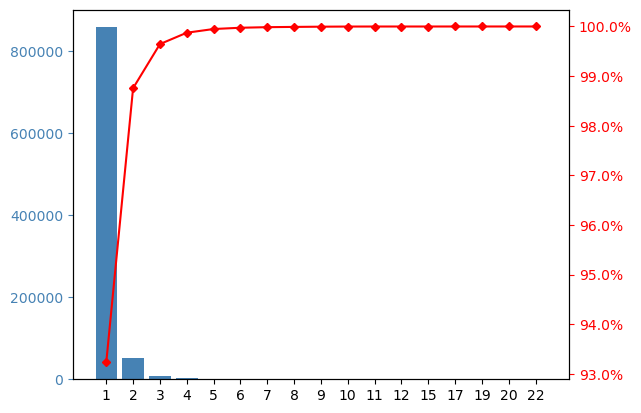

In [16]:
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# https://www.statology.org/pareto-chart-python/

color1 = 'steelblue'
color2 = 'red'
line_size = 4


fig , ax = plt.subplots()
ax.bar(review_count.index , review_count["num_review"], color = color1)
ax.set_xticks(review_count.index, review_count["total_reviews"].values)


ax2 = ax.twinx()
ax2.plot(review_count.index , review_count["cumperc"], color = color2, marker= "D", ms = line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis = 'y' , colors = color1)
ax2.tick_params(axis = 'y' , colors = color2)


plt.show()




# Over 93 percent of users wrote a total of 1 review. Therefore it would be wise to not give gifts to those who only submitted one review, even if it was a stellar one. Therefore let's limit the data to people who have written more than one review.

# Combine the data

In [17]:
total_data = pd.merge(reviews_over_votes , review_count , how = 'inner' , left_on = 'total_reviews' , right_on = 'total_reviews')
total_data


,author_steamid,total_reviews,total_upvotes,num_review,cumperc
0,76561198315585536,22,1067,1,100.000000
1,76561198239163744,20,110,1,99.999891
2,76561198062813911,19,27,1,99.999783
3,76561198045381877,17,57,2,99.999674
4,76561198068116100,17,212,2,99.999674
...,...,...,...,...,...
920749,76561199043171154,1,0,858396,93.227507
920750,76561199043643661,1,0,858396,93.227507
920751,76561199043957727,1,0,858396,93.227507
920752,76561199044202283,1,0,858396,93.227507


# We will now be masking our dataframe ,**total_data** so that we obtain the reviewer’s ID based on the limitations we place on the columns, **total_reviews** and **total_upvotes**. The new data will show the top reviewers.
 

He constructed his data on a platform called Deepnote, which has access to a slider to change the values of a and b. Since there isn't a function like that in VS Code, I created two variables where one can manually change the values.

In [18]:
a = 400 
b = 3 

In [19]:
steamid = total_data[   (total_data['total_upvotes'] >= a) & (total_data['total_reviews'] >= b)   ]['author_steamid']
# find the users that are under the limitation above and set them equal to steamid
top_users = dataset[dataset['author_steamid'].isin(steamid)]
# get data where author_steamid is in the dataframe steamid which finds the top reviewers. 
top_users



,review_id,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played,app_id,app_name,...,written_during_early_access,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,weighted_vote_score,comment_count
65886,35976053,76561198117201776,120,99,18412,0,63.0,1535694050,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,"Skyrim will always be a great game, but the ""r...",1508881998,1508881998,False,7,0,0.448111,0
66015,35919655,76561198053251883,355,27,3234,0,11.0,1571847037,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,[Content is locked. Pay 500 CC credits to read...,1508676490,1508676490,False,893,761,0.795010,20
67872,35432375,76561198027141250,1428,135,15680,0,3564.0,1594430912,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,"Skyrim was a great game, but it's almost 6 yea...",1506994267,1523745155,False,7,0,0.497772,0
68627,35244458,76561197961038549,4745,241,20024,0,8049.0,1554362372,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,Great game (not as good as Oblivion mind you) ...,1506528193,1506528193,False,910,8,0.861982,8
70210,34829972,76561198046478440,118,67,1058,0,420.0,1504927915,489830,The Elder Scrolls V: Skyrim Special Edition,...,False,english,Why are you reading reviews for this great gam...,1504936500,1505283988,True,5,0,0.552030,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981135,57535307,76561198192166873,2349,530,157,0,90.0,1574344946,701160,Kingdom Two Crowns,...,False,schinese,[b][quote]欢迎订阅我的「个人鉴赏家[url=https://store.steam...,1574262671,1574262671,True,8,12,0.621079,0
983061,47485053,76561198040884867,1858,903,446,0,325.0,1545181081,701160,Kingdom Two Crowns,...,False,english,[b]The [i]Kingdom[/i] series has always had a ...,1544629977,1544630167,True,44,2,0.795707,16
993364,56720280,76561198315585536,1350,1105,43,0,6.0,1573267155,517630,Just Cause 4,...,False,english,­,1573162869,1573162869,True,46,7,0.405999,0
993399,56654620,76561198027141250,1428,135,3767,0,827.0,1577301289,517630,Just Cause 4,...,False,english,I'm really torn on writing this review. Just C...,1573075860,1573673723,True,461,18,0.947325,41


# Data that may help us classify who is a top reviewer.

**Reviewer Analysis**

   - Number of games.
   - Playtime per game reviewed.
   
**Review Analysis**

   - Character length of average review.
   - Average comments under reviews.


In [20]:
games_owned = top_users.groupby('author_steamid')['author_num_games_owned'].max().reset_index()
# Obtains the number of games ownded by the reviewer on the top_users dataframe. 
games_owned

,author_steamid,author_num_games_owned
0,76561197961038549,4745
1,76561197964542705,364
2,76561197970314107,1962
3,76561197971724802,1138
4,76561197975051410,1283
...,...,...
79,76561198367535951,1501
80,76561198375029180,612
81,76561198377802407,479
82,76561198426608795,302


In [50]:
px.histogram(games_owned , x = 'author_num_games_owned' , nbins = 60 , template = 'simple_white', title = "Top Reviewer's , games owned" , text_auto = True)
# Histogram to show how many games the top reviewers own.

In [22]:
# Play time per game reviewed. 

play_time = top_users.groupby('author_steamid')[['author_num_games_owned','author_playtime_forever']].max().reset_index()
# Get the most up-to-date data on the author_games_owned and author_playtime. 
play_time['play_time_per_game'] = play_time['author_playtime_forever'] / play_time['author_num_games_owned']
#Find the rate.
play_time

,author_steamid,author_num_games_owned,author_playtime_forever,play_time_per_game
0,76561197961038549,4745,20024,4.220021
1,76561197964542705,364,22241,61.101648
2,76561197970314107,1962,5361,2.732416
3,76561197971724802,1138,712,0.625659
4,76561197975051410,1283,3880,3.024162
...,...,...,...,...
79,76561198367535951,1501,11480,7.648235
80,76561198375029180,612,17970,29.362745
81,76561198377802407,479,394,0.822547
82,76561198426608795,302,11672,38.649007


In [23]:
px.histogram(play_time , x = 'play_time_per_game' , template = 'simple_white' , nbins = 40,  title = 'Playtime per game of Top Reviewers', text_auto = True)



# Review analysis
    - Character length of review
    - Number of Comments(engagement)

In [24]:
top_users['review_length'] = top_users['review'].str.len()
top_users

/var/folders/yk/bd143n2d1233yn6yphs1_q1c0000gn/T/ipykernel_1949/235503721.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,review_id,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played,app_id,app_name,...,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,weighted_vote_score,comment_count,review_length
65886,35976053,76561198117201776,120,99,18412,0,63.0,1535694050,489830,The Elder Scrolls V: Skyrim Special Edition,...,english,"Skyrim will always be a great game, but the ""r...",1508881998,1508881998,False,7,0,0.448111,0,1735
66015,35919655,76561198053251883,355,27,3234,0,11.0,1571847037,489830,The Elder Scrolls V: Skyrim Special Edition,...,english,[Content is locked. Pay 500 CC credits to read...,1508676490,1508676490,False,893,761,0.795010,20,58
67872,35432375,76561198027141250,1428,135,15680,0,3564.0,1594430912,489830,The Elder Scrolls V: Skyrim Special Edition,...,english,"Skyrim was a great game, but it's almost 6 yea...",1506994267,1523745155,False,7,0,0.497772,0,2385
68627,35244458,76561197961038549,4745,241,20024,0,8049.0,1554362372,489830,The Elder Scrolls V: Skyrim Special Edition,...,english,Great game (not as good as Oblivion mind you) ...,1506528193,1506528193,False,910,8,0.861982,8,94
70210,34829972,76561198046478440,118,67,1058,0,420.0,1504927915,489830,The Elder Scrolls V: Skyrim Special Edition,...,english,Why are you reading reviews for this great gam...,1504936500,1505283988,True,5,0,0.552030,1,153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981135,57535307,76561198192166873,2349,530,157,0,90.0,1574344946,701160,Kingdom Two Crowns,...,schinese,[b][quote]欢迎订阅我的「个人鉴赏家[url=https://store.steam...,1574262671,1574262671,True,8,12,0.621079,0,263
983061,47485053,76561198040884867,1858,903,446,0,325.0,1545181081,701160,Kingdom Two Crowns,...,english,[b]The [i]Kingdom[/i] series has always had a ...,1544629977,1544630167,True,44,2,0.795707,16,2208
993364,56720280,76561198315585536,1350,1105,43,0,6.0,1573267155,517630,Just Cause 4,...,english,­,1573162869,1573162869,True,46,7,0.405999,0,1
993399,56654620,76561198027141250,1428,135,3767,0,827.0,1577301289,517630,Just Cause 4,...,english,I'm really torn on writing this review. Just C...,1573075860,1573673723,True,461,18,0.947325,41,4850


In [25]:
px.histogram(top_users , x = 'review_length' , template = 'simple_white' , nbins = 40 ,title = 'Top Reviewer\'s word count' , text_auto = True)

In [51]:
top_users[['author_steamid','comment_count']]

,author_steamid,comment_count
65886,76561198117201776,0
66015,76561198053251883,20
67872,76561198027141250,0
68627,76561197961038549,8
70210,76561198046478440,1
...,...,...
981135,76561198192166873,0
983061,76561198040884867,16
993364,76561198315585536,0
993399,76561198027141250,41


In [27]:
px.histogram(top_users , x = 'comment_count' , template = 'simple_white' , nbins = 60 ,  title = 'Top Reviewers, engagement', text_auto=  True  )

# This is the end of the Project/example that reflects a real-life problem/task that was accomplished by a data analyst.

He would then go on to create a dashboard on Deepnote, which is locked behind payment plans. 

The main skill I gained from this example is the thought process that a data analyst must have to obtain the correct data and manipulate it to show something meaningful.